# Figure - Convergence_same_iters

In [1]:
import os
work_dir = "H:/workspace/ptyrad_paper"
os.chdir(work_dir)
print("Current working dir: ", os.getcwd())

Current working dir:  H:\workspace\ptyrad_paper


In [10]:
import numpy as np
import matplotlib.pyplot as plt
from numpy.fft import fft2
from numpy.fft import fftshift
import h5py

from ptyrad.load import load_hdf5, load_ptyrad
from ptyrad.utils.image_proc import center_crop
from ptyrad.utils.math_ops import mfft2

In [12]:
plot_simu = False
no_regularization = True

if plot_simu:
    # Simu - 20GB
    path_ptyrad   = "03_output/simu_tBL_WSe2/20250219_ptyrad_convergence/full_N16384_dp128_flipT001_random16_p12_1obj_6slice_dz2_Adam_plr1e-4_oalr5e-4_oplr5e-4_slr1e-4_orblur0.4_ozblur1_oathr0.98_opos_sng1.0_spr0.03_1e6/model_iter0200.pt"
    path_ptyshv   = "03_output/simu_tBL_WSe2/20250219_ptyshv_convergence/6/roi6_Ndp128_step128/MLs_L1_p12_g16_pc1_noModel_mm_Ns6_dz2_reg0.1/Niter200.mat"
    path_py4dstem = "03_output/simu_tBL_WSe2/20250219_py4dstem_convergence/20250219_N16384_dp128_flipT001_random16_p12_6slice_dz2_update0.5_kzf0.1_1e6/model_iter0200.hdf5"
else:
    # Exp - A100
    if no_regularization:
        path_ptyrad = "03_output/tBL_WSe2/20250604_ptyrad_convergence/full_N16384_dp128_flipT100_random16_p12_1obj_6slice_dz2_Adam_plr1e-4_oalr5e-4_oplr5e-4_slr5e-4_orblur0.5_ozblur1_oathr0.98_sng1.0_aff1_0_-3_0/model_iter0200.hdf5"
    else:
        path_ptyrad = "03_output/tBL_WSe2/20250131_ptyrad_convergence/full_N16384_dp128_flipT100_random16_p12_1obj_6slice_dz2_Adam_plr1e-4_oalr5e-4_oplr5e-4_slr5e-4_orblur0.4_ozblur1_oathr0.98_opos_sng1.0_spr0.1_aff1_0_-3_0/model_iter0200.pt"
    path_ptyshv   = "03_output/tBL_WSe2/20250202_ptyshv_convergence/13/roi13_Ndp128_step128/MLs_L1_p12_g16_pc0_noModel_updW100_mm_Ns6_dz2_reg0.1_dpFlip_ud_T/Niter200.mat"
    path_py4dstem = "03_output/tBL_WSe2/20250224_py4DSTEM_convergence/N16384_dp128_flipT100_random16_p12_6slice_dz2_update0.5_kzf0.1_a100/model_iter0200.hdf5"

obj_ptyrad = center_crop(load_ptyrad(path_ptyrad)['optimizable_tensors']['objp'].squeeze().sum(0), 384, 384)
iter_time_ptyrad = load_ptyrad(path_ptyrad)['avg_iter_t'] # Note that the iter_t on c0001 for ptyrad seems to fluctuate quite alot from 9-13sec, this one is 12.6sec

with h5py.File(path_ptyshv, "r") as hdf_file:
    obj_ptyshv = center_crop(np.angle(np.array(hdf_file['object']).view('complex128')).sum(0).T, 384, 384)
    iter_time_ptyshv = hdf_file['outputs']['avgTimePerIter'][()].squeeze()[()]

with h5py.File(path_py4dstem, "r") as hdf_file:
    obj_py4dstem = center_crop(np.angle(np.array(hdf_file['object']).view('complex64')).sum(0), 384, 384)
    iter_time_py4dstem = load_hdf5(path_py4dstem, key='iter_times').mean()

# P+S decomposition FFT, note that this requires a float32 dtype
fft_ptyrad   = np.log(np.abs(fftshift(mfft2(obj_ptyrad)[0])))
fft_ptyshv   = np.log(np.abs(fftshift(mfft2(obj_ptyshv)[0])))
fft_py4dstem = np.log(np.abs(fftshift(mfft2(obj_py4dstem)[0])))

# fft_ptyrad = np.log(np.abs(fftshift(fft2(obj_ptyrad))))
# fft_ptyshv = np.log(np.abs(fftshift(fft2(obj_ptyshv))))
# fft_py4dstem = np.log(np.abs(fftshift(fft2(obj_py4dstem))))

Success! Loaded .hdf5 file as a dict from path = '03_output/tBL_WSe2/20250604_ptyrad_convergence/full_N16384_dp128_flipT100_random16_p12_1obj_6slice_dz2_Adam_plr1e-4_oalr5e-4_oplr5e-4_slr5e-4_orblur0.5_ozblur1_oathr0.98_sng1.0_aff1_0_-3_0/model_iter0200.hdf5'
Success! Loaded .hdf5 file as a dict from path = '03_output/tBL_WSe2/20250604_ptyrad_convergence/full_N16384_dp128_flipT100_random16_p12_1obj_6slice_dz2_Adam_plr1e-4_oalr5e-4_oplr5e-4_slr5e-4_orblur0.5_ozblur1_oathr0.98_sng1.0_aff1_0_-3_0/model_iter0200.hdf5'
Success! Loaded .hdf5 file with key = 'iter_times' from path = '03_output/tBL_WSe2/20250224_py4DSTEM_convergence/N16384_dp128_flipT100_random16_p12_6slice_dz2_update0.5_kzf0.1_a100/model_iter0200.hdf5'
Imported .hdf5 data shape = (200,)
Imported .hdf5 data type = float64


## Updated in-set region

plot_simu = False


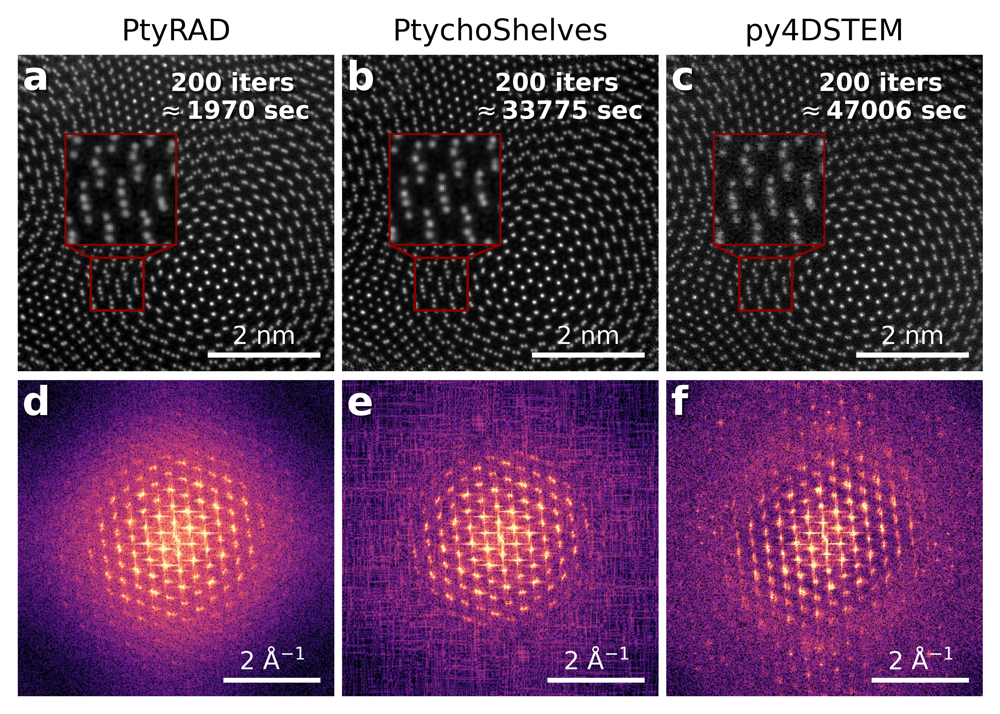

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm

print(f"plot_simu = {plot_simu}")

# Create figure with GridSpec
fig = plt.figure(figsize=(7, 5), dpi=600)
gs = GridSpec(2, 3, figure=fig, wspace=0.025, hspace=-0.095)  # Control spacing

# Titles for the columns
titles = ['PtyRAD', 'PtychoShelves', 'py4DSTEM']
iter_value = 200
iterations_labels = [f'{iter_value} iters\n'+r'$\approx$'+f'{np.int32(iter_time_ptyrad*iter_value)} sec', 
                     f'{iter_value} iters\n'+r'$\approx$'+f'{np.int32(iter_time_ptyshv*iter_value)} sec', 
                     f'{iter_value} iters\n'+r'$\approx$'+f'{np.int32(iter_time_py4dstem*iter_value)} sec']
panel_labels = ['a', 'b', 'c', 'd', 'e', 'f']
shadow_offset = (3, 3)
zoom_region = (88, 152, 310, 246) #(270, 320, 65, 15)  # Define zoom regions for each panel
time_label_loc = [260,20]

# Top row (images)
for i, (obj, title, label, iters) in enumerate(zip([obj_ptyrad, obj_ptyshv, obj_py4dstem], titles, panel_labels[:3], iterations_labels)):
    ax = fig.add_subplot(gs[0, i])

    # Scale bar settings
    scale_bar_length = 134
    scale_bar_label = "2 nm"
    fontprops = fm.FontProperties(size=10)
    
    # Main image
    vmin, vmax = np.percentile(obj, [1, 99.95])
    ax.imshow(obj, cmap='gray', origin='upper', vmin=vmin, vmax=vmax)
    ax.set_title(title, fontsize=12)
    ax.axis('off')

    # Panel label with shadow
    ax.text(5 + shadow_offset[0], 5 + shadow_offset[1], label, color='black', fontsize=16, fontweight='bold', va='top', ha='left', alpha=0.6)
    ax.text(5, 5, label, color='white', fontsize=16, fontweight='bold', va='top', ha='left')

    # Iteration time label with shadow
    ax.text(time_label_loc[0] + shadow_offset[0], 
            time_label_loc[1] + shadow_offset[1], iters, color='black', fontsize=10, fontweight='bold', va='top', ha='center', alpha=0.6)
    ax.text(time_label_loc[0], 
            time_label_loc[1], iters, color='white', fontsize=10, fontweight='bold', ha='center', va='top')

    # Scale bar
    scalebar = AnchoredSizeBar(ax.transData, scale_bar_length, scale_bar_label,
                               loc='lower right', pad=0.5, color="white", frameon=False, size_vertical=3, label_top=True,
                               fontproperties=fontprops)
    ax.add_artist(scalebar)

    # Zoom-in inset
    x1, x2, y1, y2 = zoom_region
    axins = ax.inset_axes([0.15, 0.40, 0.35, 0.35], xlim=(x1, x2), ylim=(y1, y2)) # [x0, y0, width, height], Lower-left corner of inset Axes, and its width and height.
    axins.imshow(obj, cmap='gray', origin='upper', vmin=vmin, vmax=vmax)
    axins.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

    for spine in axins.spines.values():
        spine.set_edgecolor('darkred')

    mark_inset(ax, axins, loc1=3, loc2=4, fc="none", ec="darkred")
    
# Bottom row (FFTs)
for i, (fft, label) in enumerate(zip([fft_ptyrad, fft_ptyshv, fft_py4dstem], panel_labels[3:])):
    ax = fig.add_subplot(gs[1, i])

    # Scale bar settings
    scale_bar_length = 115
    scale_bar_label = "2 $\\mathrm{\\AA}^{-1}$"
    
    # Main FFT image
    vmin, vmax = np.percentile(fft, [5, 99.5])
    ax.imshow(fft, cmap='magma', vmin=vmin, vmax=vmax)
    ax.axis('off')

    # Panel label with shadow
    ax.text(5 + shadow_offset[0], 5 + shadow_offset[1], label, color='black', fontsize=16, fontweight='bold', va='top', ha='left', alpha=0.6)
    ax.text(5, 5, label, color='white', fontsize=16, fontweight='bold', va='top', ha='left')

    # Scale bar
    scalebar = AnchoredSizeBar(ax.transData, scale_bar_length, scale_bar_label,
                               loc='lower right', pad=0.5, color="white", frameon=False, size_vertical=3, label_top=True,
                               fontproperties=fontprops)
    ax.add_artist(scalebar)


# Uncomment the savefig lines based on your loaded files

if plot_simu:
    plt.savefig("05_figures/Fig_S02_convergence_same_iters_simu_20GB.pdf", bbox_inches="tight")
else:
    if no_regularization:
        fig_name = 'Fig_04_convergence_same_iters_exp_a100_no_regularization' # Change this later to SI number once I know the total list
    else:
        fig_name = 'Fig_04_convergence_same_iters_exp_a100'
    plt.savefig(f"05_figures/{fig_name}.pdf", bbox_inches="tight")
    plt.savefig(f"05_figures/{fig_name}.png", bbox_inches="tight")

# Show the plot
plt.show()
